In [1]:
from fastai2.vision.all import *

In [2]:
!pwd

/home/heye0507/wheat_detection/nbs


In [3]:
path = Path('/home/heye0507/wheat_detection/')
DATA_PATH = path/'data'
DATA_PATH.ls()

(#4) [Path('/home/heye0507/wheat_detection/data/train.csv'),Path('/home/heye0507/wheat_detection/data/train'),Path('/home/heye0507/wheat_detection/data/test'),Path('/home/heye0507/wheat_detection/data/sample_submission.csv')]

In [4]:
df = pd.read_csv(DATA_PATH/'train.csv')
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [15]:
df.shape

(147793, 5)

In [17]:
df.groupby('image_id').count().describe()

,width,height,bbox,source
count,3373.000000,3373.000000,3373.000000,3373.000000
mean,43.816484,43.816484,43.816484,43.816484
std,20.374820,20.374820,20.374820,20.374820
min,1.000000,1.000000,1.000000,1.000000
25%,28.000000,28.000000,28.000000,28.000000
50%,43.000000,43.000000,43.000000,43.000000
75%,59.000000,59.000000,59.000000,59.000000
max,116.000000,116.000000,116.000000,116.000000


1. 3373 unique items
2. each images on average has 43 bbox, \[1,116\], don't have none



In [19]:
df.source.unique()

array(['usask_1', 'arvalis_1', 'inrae_1', 'ethz_1', 'arvalis_3', 'rres_1',
       'arvalis_2'], dtype=object)

In [30]:
df.groupby(['source']).agg({'image_id':['count']})

,image_id
,count
source,
arvalis_1,45716
arvalis_2,4179
arvalis_3,16665
ethz_1,51489
inrae_1,3701
rres_1,20236
usask_1,5807


Question:

1. 7 locations, data are imbalanced

2. Two options come to my mind,

    2a. make a 2 stage detector, to figure out where this location is, predict bbox

    2b. universal detector \[depends on how different the data looks like\]

\# To do, pick data and take a look

In [39]:
sources = df.source.unique()
sources

array(['usask_1', 'arvalis_1', 'inrae_1', 'ethz_1', 'arvalis_3', 'rres_1',
       'arvalis_2'], dtype=object)

In [123]:
df[df['source'] == 'usask_1']

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1
...,...,...,...,...,...
5802,5a9be233e,1024,1024,"[748.0, 778.0, 105.0, 50.0]",usask_1
5803,5a9be233e,1024,1024,"[951.0, 621.0, 73.0, 65.0]",usask_1
5804,5a9be233e,1024,1024,"[491.0, 450.0, 62.0, 63.0]",usask_1
5805,5a9be233e,1024,1024,"[931.0, 363.0, 93.0, 48.0]",usask_1


In [124]:
for s in sources:
    df_local = df[df['source']==s]
    df_local.to_csv(str(DATA_PATH/s)+'.csv')

In [125]:
Path(DATA_PATH/'train').ls()

(#3422) [Path('/home/heye0507/wheat_detection/data/train/9052c4be4.jpg'),Path('/home/heye0507/wheat_detection/data/train/4ddaaf93f.jpg'),Path('/home/heye0507/wheat_detection/data/train/57956c488.jpg'),Path('/home/heye0507/wheat_detection/data/train/12d014f3e.jpg'),Path('/home/heye0507/wheat_detection/data/train/7de1fc333.jpg'),Path('/home/heye0507/wheat_detection/data/train/4ae7a034a.jpg'),Path('/home/heye0507/wheat_detection/data/train/4f14fa438.jpg'),Path('/home/heye0507/wheat_detection/data/train/9fd01faae.jpg'),Path('/home/heye0507/wheat_detection/data/train/b3c96d5ad.jpg'),Path('/home/heye0507/wheat_detection/data/train/ac6b1b3a3.jpg')...]

In [126]:
df_usa_1 = pd.read_csv(DATA_PATH/'usask_1.csv')
df_usa_1.head()

,Unnamed: 0,image_id,width,height,bbox,source
0,0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [106]:
[float(i) for i in df_usa_1['bbox'][0][1:-1].split(',')]

[834.0, 222.0, 56.0, 36.0]

In [185]:
# Fastai bbox style is [x1,y1,x2,y2], given coco-style is [x1,y1,w,h]
def convert_fastai_bbox(box):
    x1,y1,w,h = box
    x2 = x1 + w
    y2 = y1 + h
    return [x1,y1,x2,y2]

# Pre-processing steps

1. problem of using df_raw, each bounding box is listed as a separate row, need to join them to avoid reconstructing same tensor with different bbox
2. once genereate image_id to bbox dict, there is no need to pass in df for datablock API

## Issues:
1. Fastai v2 auto called random split even in the datablock API is not specified 
2. A label is required, if you dont specify bbox label, fastai v2 will try to assign multi-category block for you

In [186]:
def prep_bbox(df):
    images, bbox = df['image_id'],df['bbox']
    d = collections.defaultdict(list)
    for i,b in zip(images,bbox):
        d[i].append(convert_fastai_bbox([float(i) for i in b[1:-1].split(',')]))
    return d
img2bbox = prep_bbox(df_usa_1)

In [138]:
str(DATA_PATH/'train')+'/b6ab77fd7'+'.jpg'

'/home/heye0507/wheat_detection/data/train/b6ab77fd7.jpg'

In [162]:
len(img2bbox.keys())

200

In [187]:
len(img2bbox['b6ab77fd7'])

47

In [207]:
dblocks_test = DataBlock(
    blocks = (ImageBlock,BBoxBlock,BBoxLblBlock),
    splitter = RandomSplitter(valid_pct=0.),
    get_x = lambda o: str(DATA_PATH/'train')+'/'+o+'.jpg',
    get_y = [lambda o: img2bbox[o], lambda o: ['wheat' for i in range(len(img2bbox[o]))]],
    item_tfms = Resize(512),
    n_inp=1
)

In [208]:
dls = dblocks_test.dataloaders(img2bbox.keys(),bs=4)

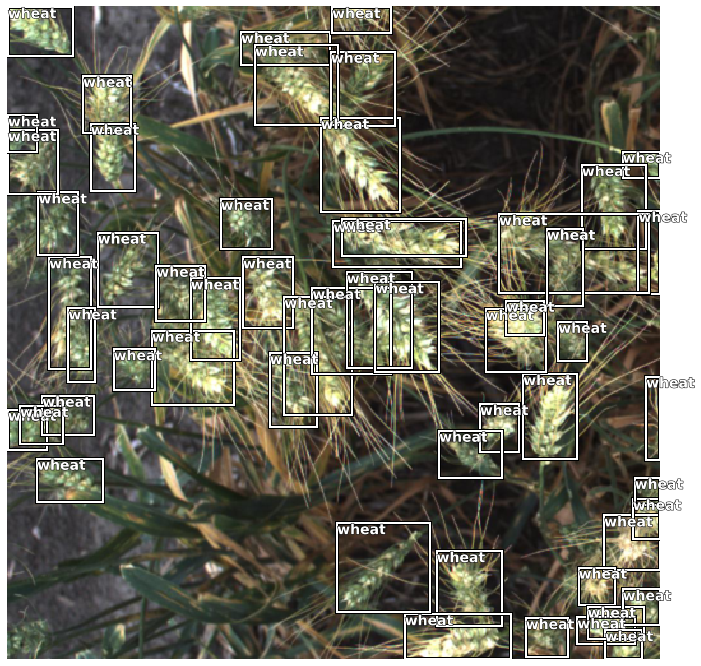

In [209]:
dls.show_batch(max_n=1,ncols=1,figsize=(12,12))

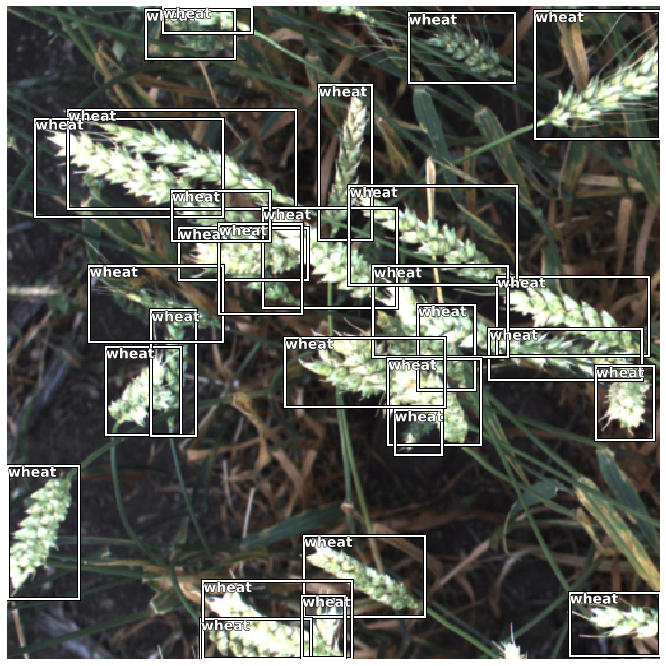

In [210]:
dls.show_batch(max_n=1,ncols=1,figsize=(12,12))

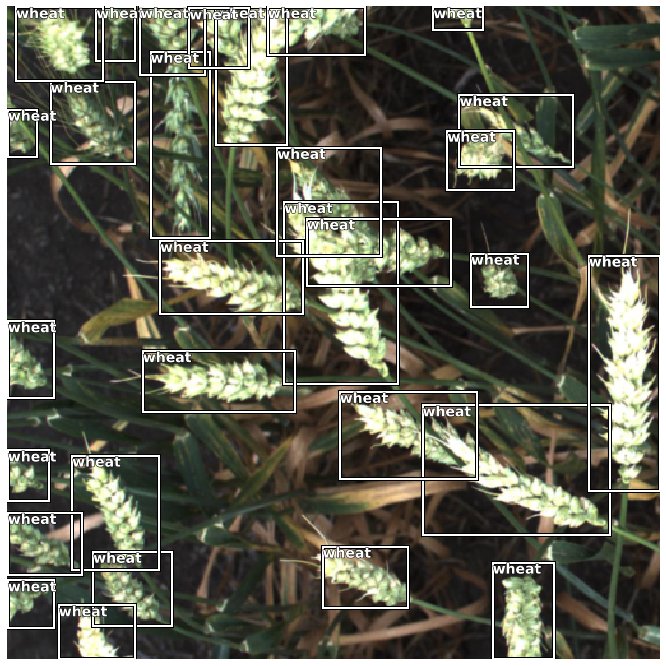

In [211]:
dls.show_batch(max_n=1,ncols=1,figsize=(12,12))

# Try a different location, see if I can eyeballing the difference

In [221]:
!ls /home/heye0507/wheat_detection/data

arvalis_1.csv  ethz_1.csv   sample_submission.csv  train.csv
arvalis_2.csv  inrae_1.csv  test		   usask_1.csv
arvalis_3.csv  rres_1.csv   train


In [222]:
df_arvalis_1 = pd.read_csv(DATA_PATH/'arvalis_1.csv')
df_arvalis_1.head()

,Unnamed: 0,image_id,width,height,bbox,source
0,5807,44c60402e,1024,1024,"[830.0, 21.0, 66.0, 57.0]",arvalis_1
1,5808,44c60402e,1024,1024,"[752.0, 0.0, 52.0, 49.0]",arvalis_1
2,5809,44c60402e,1024,1024,"[321.0, 0.0, 146.0, 32.0]",arvalis_1
3,5810,44c60402e,1024,1024,"[363.0, 32.0, 108.0, 65.0]",arvalis_1
4,5811,44c60402e,1024,1024,"[555.0, 63.0, 57.0, 46.0]",arvalis_1


In [223]:
Path(DATA_PATH/'arvalis_1.csv').parent

Path('/home/heye0507/wheat_detection/data')

In [226]:
def get_data(path,sz=224,bs=64):
    base = Path(path).parent
    df = pd.read_csv(path)
    img2bbox = prep_bbox(df)
    dblocks = DataBlock(
        blocks = (ImageBlock,BBoxBlock,BBoxLblBlock),
        splitter = RandomSplitter(valid_pct=0.),
        get_x = lambda o: str(base/'train')+'/'+o+'.jpg',
        get_y = [lambda o: img2bbox[o], lambda o: ['wheat' for i in range(len(img2bbox[o]))]],
        item_tfms = Resize(sz),
        n_inp=1
    )
    return dblocks.dataloaders(img2bbox.keys(),bs=bs)

In [227]:
dls = get_data(DATA_PATH/'arvalis_1.csv',sz=512,bs=4)

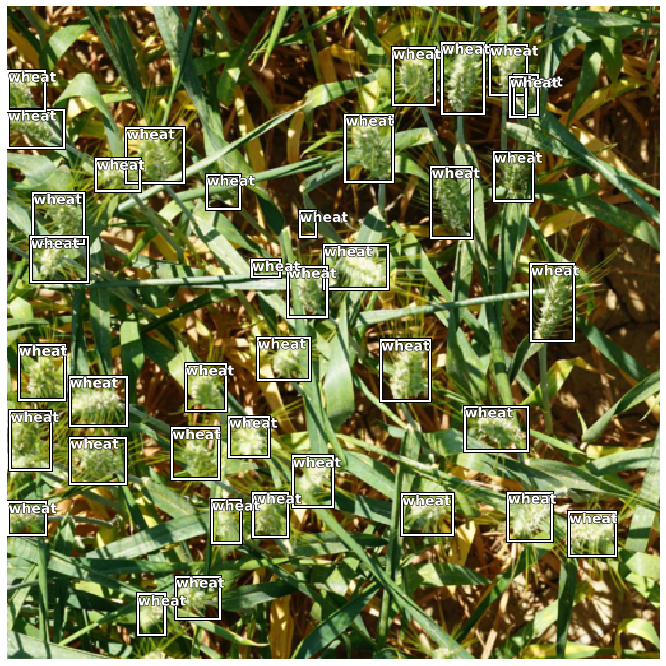

In [228]:
dls.show_batch(max_n=1,figsize=(12,12))

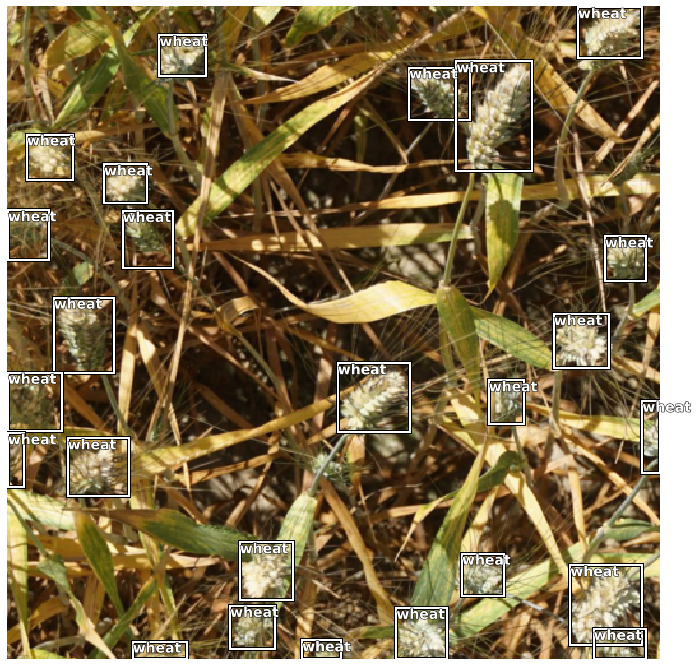

In [229]:
dls.show_batch(max_n=1,figsize=(12,12))

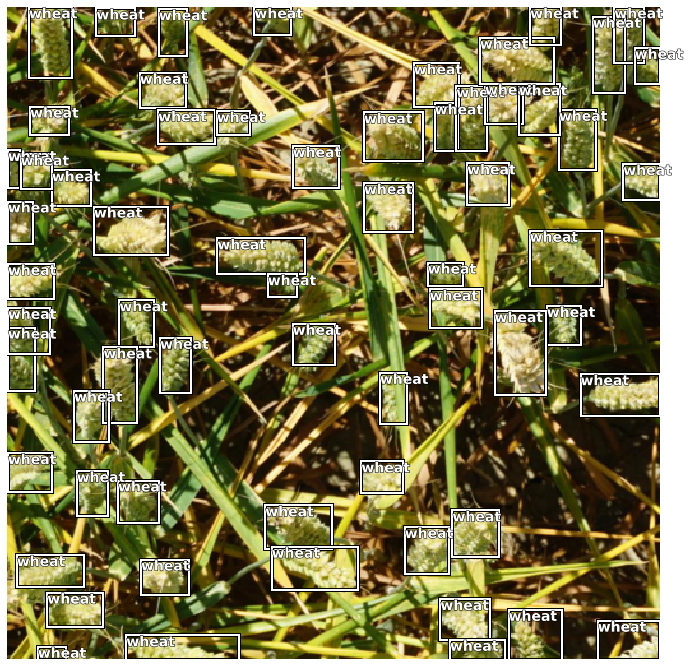

In [230]:
dls.show_batch(max_n=1,figsize=(12,12))